# Smart Traffic Lights (STL) Research

Topic: Vehicle Detection Model <br />
Author: Wulan Mantiri <br />
Date: September 2021

## Background

There are 3 primary options when it comes to deep learning object detection model:

1. Faster Region-based Convolutional Neural Network (**Faster R-CNN**)

Faster R-CNN is an improvement of R-CNN in terms of speed while maintaining its accuracy. How it works is *simply* by generating "regions" or bounding boxes then performing image classfication with CNN in those regions. While R-CNN and its variants tend to be very accurate, the biggest problem is their speed — they were incredibly slow even on a GPU.

Faster R-CNN demonstrates a **small accuracy advantage if real-time speed is not needed**.

2. Single Shot Detector (SSD)

SSD takes image as input and calculates a feature map. It then divides the image to grids called "anchor boxes" similar to Faster-RCNN, but it learns the offset values rather than the boxes. It is claimed that SSD achieves a good **balance between speed and accuracy**.

3. You Only Look Once (YOLO)

Unlike R-CNN that does not look at the complete image, YOLO considers detection to be a regression problem, which learns to predict the class probabilities and bounding box coordinates. How it works is that the image is split into grids, within each grid we take several bounding boxes. For each bounding box, it outputs a class probability and offset values. If the probability is above threshold, the bounding box is selected and used to locate the object within the image.

YOLO is made for **super fast requirements if accuracy is not priority**, but it can made flexible.


*References*: 
- https://cv-tricks.com/object-detection/faster-r-cnn-yolo-ssd/
- https://github.com/arunponnusamy/cvlib/
- https://github.com/AlexeyAB/darknet

## Winning Model: YOLOv4

### Installation

In [ ]:
!pip install progressbar -q
!pip install imutils -q
!pip install opencv-python -q

In [1]:
import requests
import progressbar as pb
import imageio
from imutils import paths

import os
import cv2
import numpy as np

import time
import matplotlib.pyplot as plt
import pandas as pd

### Configuration

In [2]:
DEST_DIR = os.path.expanduser('~') + os.path.sep + 'smart-traffic' + os.path.sep + 'model'

COLORS = np.random.uniform(0, 255, size=(80, 3))

CFG_FILE_NAME = 'yolov4.cfg'
CFG_URL = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4.cfg'

WEIGHTS_FILE_NAME = 'yolov4.weights'
WEIGHTS_URL = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v3_optimal/yolov4.weights'

CLASS_FILE_NAME = 'coco_classes.txt'
CLASS_URL = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/data/coco.names'

### Utils

In [3]:
def download_file(url, file_name, dest_dir):
    """A method to download file from public url
    Args:
        url: download url
        file_name: given name of to-be-downloaded file
        dest_dir: download destination directory
    """

    if not os.path.exists(dest_dir):
        os.makedirs(dest_dir)

    full_path_to_file = dest_dir + os.path.sep + file_name
    if os.path.exists(dest_dir + os.path.sep + file_name):
        return full_path_to_file

    print("Downloading " + file_name + " from " + url)

    try:
        r = requests.get(url, allow_redirects=True, stream=True)
    except:
        print("Could not establish connection. Download failed")
        return None

    file_size = int(r.headers['Content-Length'])
    chunk_size = 1024
    num_bars = round(file_size / chunk_size)

    bar = pb.ProgressBar(maxval=num_bars).start()

    if r.status_code != requests.codes.ok:
        print("Error occurred while downloading file")
        return None

    count = 0    
    with open(full_path_to_file, 'wb') as file:
        for chunk in  r.iter_content(chunk_size=chunk_size):
            file.write(chunk)
            bar.update(count)
            count +=1

    return full_path_to_file

### Class Label Population

In [4]:
def populate_class_labels():
    """A method to obtain class labels for model based on CLASS_* configuration"""

    class_file_abs_path = DEST_DIR + os.path.sep + CLASS_FILE_NAME
    if not os.path.exists(class_file_abs_path):
        download_file(url=CLASS_URL, file_name=CLASS_FILE_NAME, dest_dir=DEST_DIR)
    f = open(class_file_abs_path, 'r')
    classes = [line.strip() for line in f.readlines()]
    return classes

# Pre-populate class labels
classes = populate_class_labels()

### Object Detection

In [5]:
def get_output_layers(net):
    layer_names = net.getLayerNames()
    output_layers = [layer_names[i[0] - 1] for i in net.getUnconnectedOutLayers()]
    return output_layers



def draw_bbox(img, bbox, labels, confidence, colors=None, write_conf=True):
    """A method to apply a box to the image
    Args:
        img: An image in the form of a numPy array
        bbox: An array of bounding boxes
        labels: An array of labels
        colors: An array of colours the length of the number of targets(80)
        write_conf: An option to write the confidences to the image
    """
    for i, label in enumerate(labels):
        if colors is None:
            color = COLORS[classes.index(label)]            
        else:
            color = colors[classes.index(label)]

        if write_conf:
            label += ' ' + str(format(confidence[i] * 100, '.2f')) + '%'

        cv2.rectangle(img, (bbox[i][0],bbox[i][1]), (bbox[i][2],bbox[i][3]), color, 2)
        cv2.putText(img, label, (bbox[i][0],bbox[i][1]-10), cv2.FONT_HERSHEY_SIMPLEX, 0.5, color, 2)
    return img



def detect_common_objects(image, confidence=0.21, nms_thresh=0.5, size=416, enable_gpu=False):
    """A method to detect common objects (with most suitable default params)
    Args:
        image: A colour image in a numpy array
        confidence: A value to filter out objects recognised to a lower confidence score
        nms_thresh: An NMS value
        size: A blob size (width, height)
        enable_gpu: A boolean to set whether the GPU will be used
    """

    height, width = image.shape[:2]
    scale = 0.00392

    config_file_abs_path = DEST_DIR + os.path.sep + CFG_FILE_NAME
    if not os.path.exists(config_file_abs_path):
        download_file(url=CFG_URL, file_name=CFG_FILE_NAME, dest_dir=DEST_DIR)

    weights_file_abs_path = DEST_DIR + os.path.sep + WEIGHTS_FILE_NAME    
    if not os.path.exists(weights_file_abs_path):
        download_file(url=WEIGHTS_URL, file_name=WEIGHTS_FILE_NAME, dest_dir=DEST_DIR)    

    net = cv2.dnn.readNet(weights_file_abs_path, config_file_abs_path)
    blob = cv2.dnn.blobFromImage(image, scale, (size,size), (0,0,0), True, crop=False)

    # enables opencv dnn module to use CUDA on Nvidia card instead of CPU
    if enable_gpu:
        net.setPreferableBackend(cv2.dnn.DNN_BACKEND_CUDA)
        net.setPreferableTarget(cv2.dnn.DNN_TARGET_CUDA)

    net.setInput(blob)
    outs = net.forward(get_output_layers(net))

    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            max_conf = scores[class_id]
            if max_conf > confidence:
                center_x = int(detection[0] * width)
                center_y = int(detection[1] * height)
                w = int(detection[2] * width)
                h = int(detection[3] * height)
                x = center_x - (w / 2)
                y = center_y - (h / 2)
                class_ids.append(class_id)
                confidences.append(float(max_conf))
                boxes.append([x, y, w, h])

    indices = cv2.dnn.NMSBoxes(boxes, confidences, confidence, nms_thresh)

    bbox = []
    label = []
    conf = []
    for i in indices:
        i = i[0]
        box = boxes[i]
        x = box[0]
        y = box[1]
        w = box[2]
        h = box[3]
        bbox.append([int(x), int(y), int(x+w), int(y+h)])
        label.append(str(classes[class_ids[i]]))
        conf.append(confidences[i])

    return bbox, label, conf



def count_vehicles(labels):
    res = {
        'car': 0,
        'truck': 0,
        'motorbike': 0,
        'bus': 0,
    }
    for name in labels:
        try:
            res[name] += 1
        except KeyError:
            pass
    res['total'] = sum(res.values())
    return res

### Example

In [6]:
file_name = "traffic.png"

image = cv2.imread(file_name)
box, labels, count = detect_common_objects(image, size=1280)
output = draw_bbox(image, box, labels, count)

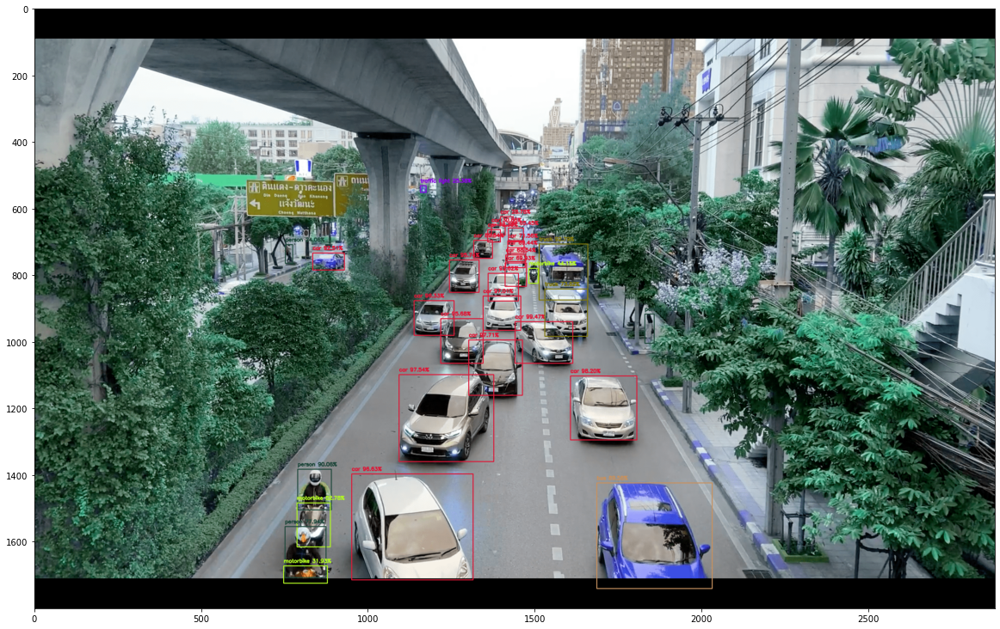

Vehicles: {'car': 20, 'truck': 2, 'motorbike': 3, 'bus': 1, 'total': 26}


In [7]:
plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()
print('Vehicles:', count_vehicles(labels))

In [ ]:
# Save image with bbox
cv2.imwrite("traffic_yolov4.png", output)

## Amazon Rekognition

In [8]:
import boto3
rekognition_client = boto3.client('rekognition')


def detect_objects_with_rekog(file_name):
    with open(file_name, 'rb') as image:
        response = rekognition_client.detect_labels(
            Image={'Bytes': image.read()},
            MinConfidence=0,
        )
    return response


def count_vehicles_rekog(response):
    res = {
        'Car': 0,
        'Motorcycle': 0,
        'Bus': 0,
    }
    for label in response['Labels']:
        try:
            name = label['Name']
            res[name] += len(label['Instances'])
        except KeyError:
            pass
    res['total'] = sum(res.values())
    return res

### Example

In [9]:
file_name = "traffic.png"
response = detect_objects_with_rekog(file_name)

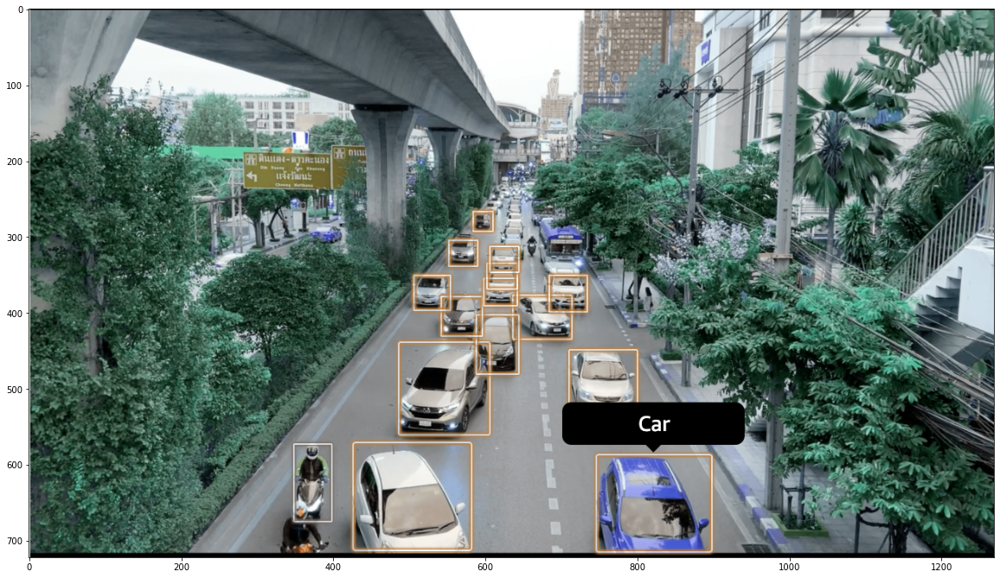

Vehicles: {'Car': 14, 'Motorcycle': 0, 'Bus': 0, 'total': 14}


In [10]:
rekog_res = cv2.imread("traffic_rekog_res.png")
plt.figure(figsize=(20,15))
plt.imshow(rekog_res)
plt.show()
print('Vehicles:', count_vehicles_rekog(response))

## Comparison (Amazon Rekognition vs YOLOv4)

1. High quality picture (2.6 MB): more than 85% better with total vehicles of 26 vs 14

Comparison has been done from samples above. Tradeoff: speed (needs ~10s to detect vehicles)

2. Close-up high quality picture (1.2 MB): more than 58% better with total vehicles of 27 vs 17

In [11]:
file_name = "traffic3.png"

# Yolov4 model
image = cv2.imread(file_name)
box, labels, count = detect_common_objects(image, size=1280)
output = draw_bbox(image, box, labels, count)

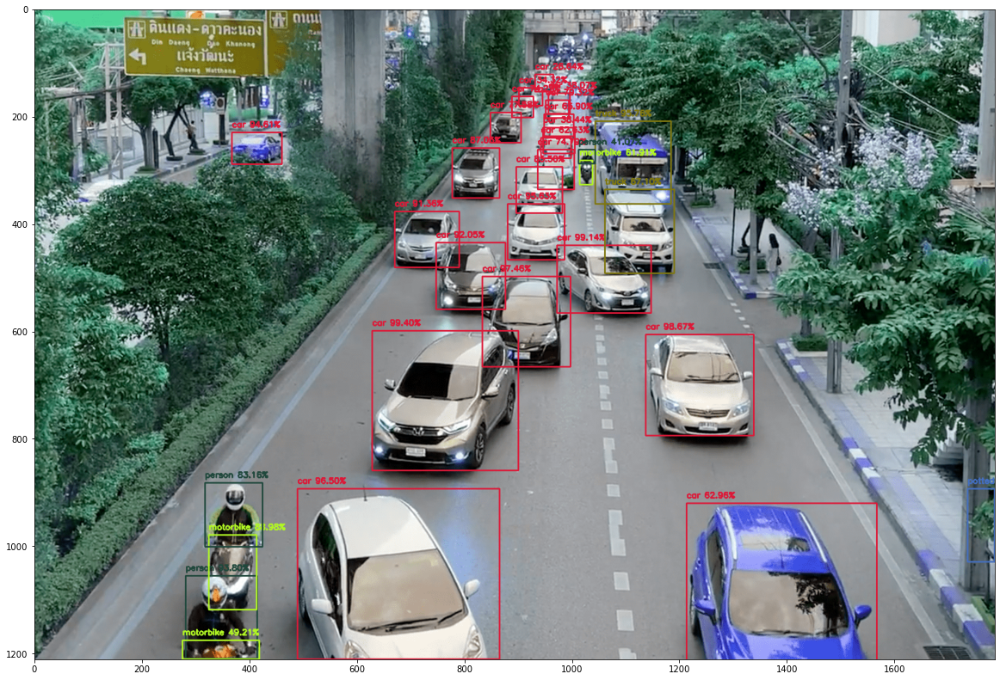

Vehicles: {'car': 22, 'truck': 2, 'motorbike': 3, 'bus': 0, 'total': 27}


In [12]:
plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()
print('Vehicles:', count_vehicles(labels))

In [13]:
# Amazon Rekognition
response = detect_objects_with_rekog(file_name)

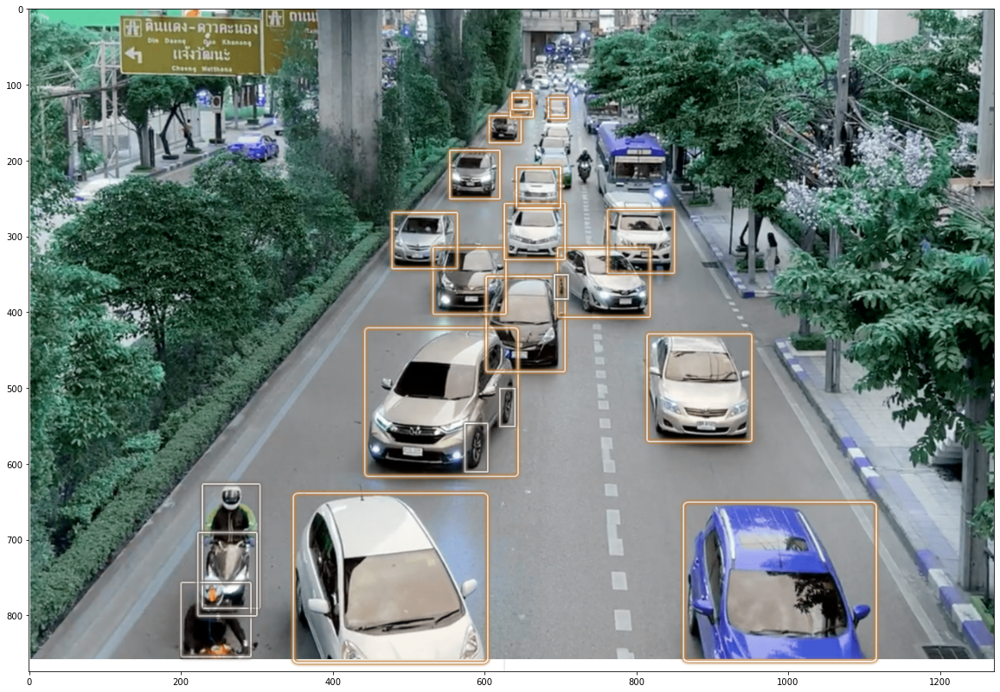

Vehicles: {'Car': 16, 'Motorcycle': 1, 'Bus': 0, 'total': 17}


In [14]:
rekog_res = cv2.imread("traffic3_rekog_res.png")
plt.figure(figsize=(20,15))
plt.imshow(rekog_res)
plt.show()
print('Vehicles:', count_vehicles_rekog(response))

3. Low quality picture (40 kB): 120% better with total vehicles of 12 vs 5

In [15]:
file_name = "traffic2.jpg"

# Yolov4 model
image = cv2.imread(file_name)
box, labels, count = detect_common_objects(image)
output = draw_bbox(image, box, labels, count)

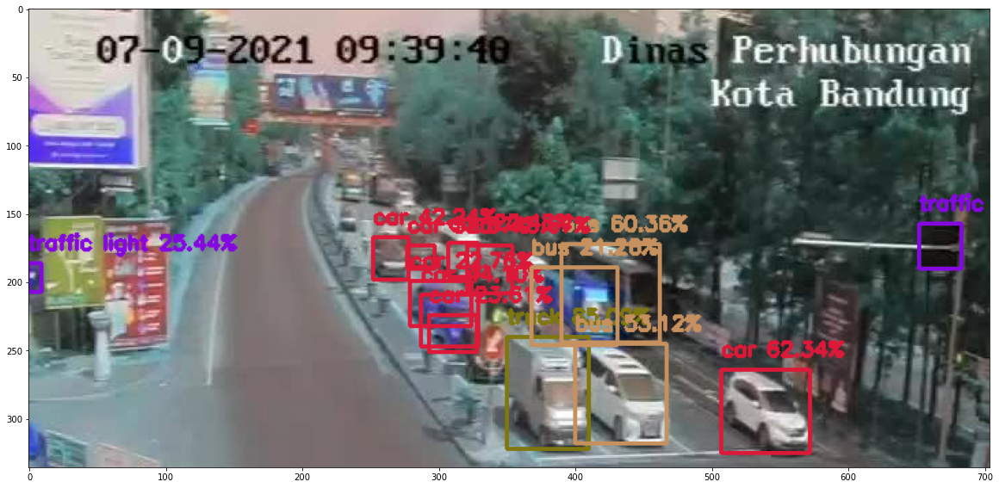

Vehicles: {'car': 8, 'truck': 1, 'motorbike': 0, 'bus': 3, 'total': 12}


In [16]:
plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()
print('Vehicles:', count_vehicles(labels))

In [ ]:
# Save image with bbox
cv2.imwrite("traffic2_bbox.png", output)

In [17]:
# Amazon Rekognition
response = detect_objects_with_rekog(file_name)

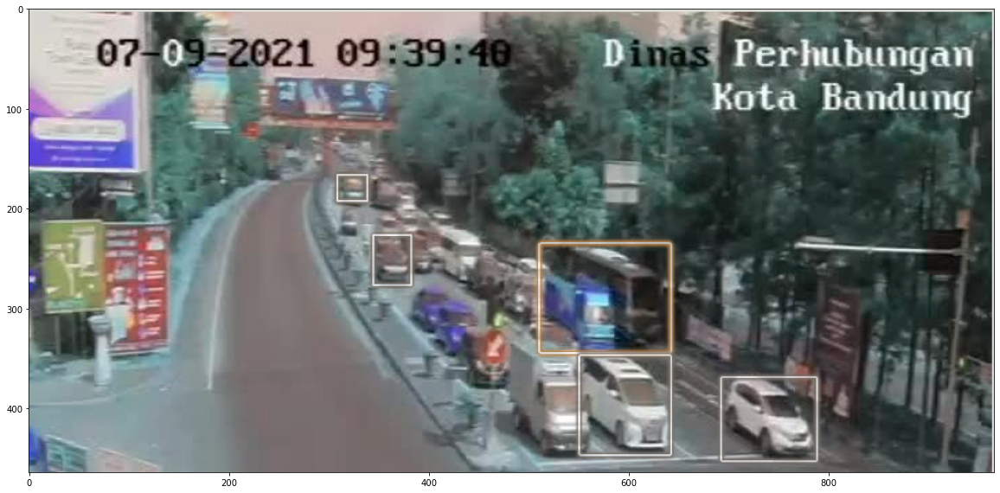

Vehicles: {'Car': 4, 'Motorcycle': 0, 'Bus': 1, 'total': 5}


In [18]:
rekog_res = cv2.imread("traffic2_rekog_res.png")
plt.figure(figsize=(20,15))
plt.imshow(rekog_res)
plt.show()
print('Vehicles:', count_vehicles_rekog(response))

4. Dark low quality picture (98 kB): unanimously better with total vehicles of 10 vs 0

In [19]:
file_name = "traffic4.jpg"

# Yolov4 model
image = cv2.imread(file_name)
box, labels, count = detect_common_objects(image)
output = draw_bbox(image, box, labels, count)

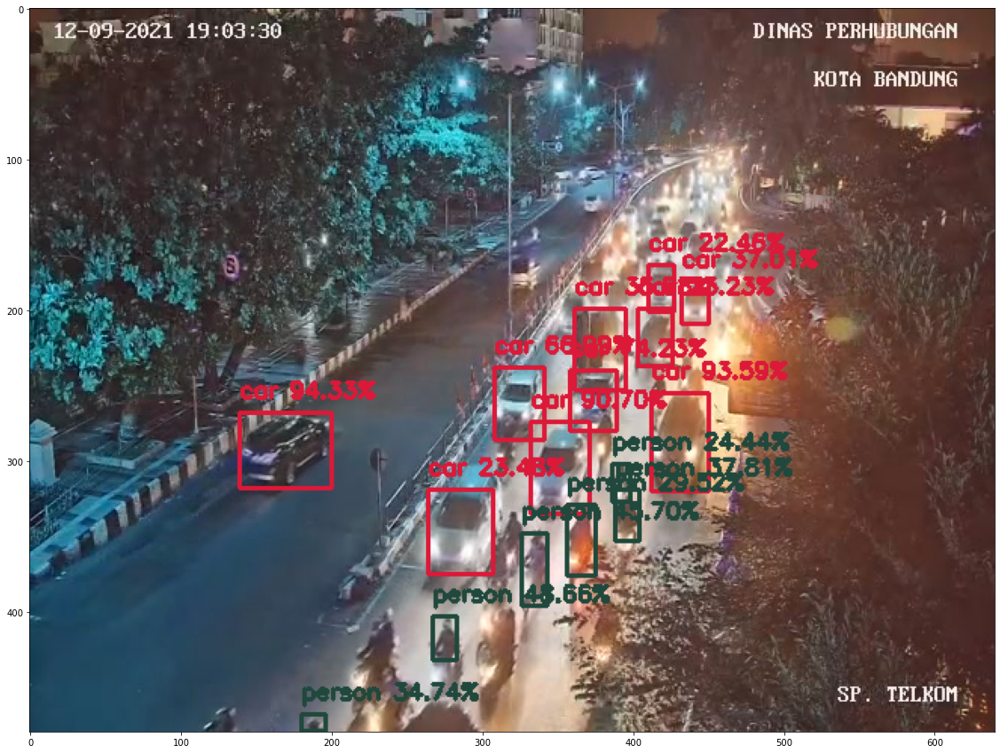

Vehicles: {'car': 10, 'truck': 0, 'motorbike': 0, 'bus': 0, 'total': 10}


In [20]:
plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()
print('Vehicles:', count_vehicles(labels))

In [ ]:
# Save image with bbox
cv2.imwrite("traffic4_bbox.png", output)

In [21]:
# Amazon Rekognition
response = detect_objects_with_rekog(file_name)

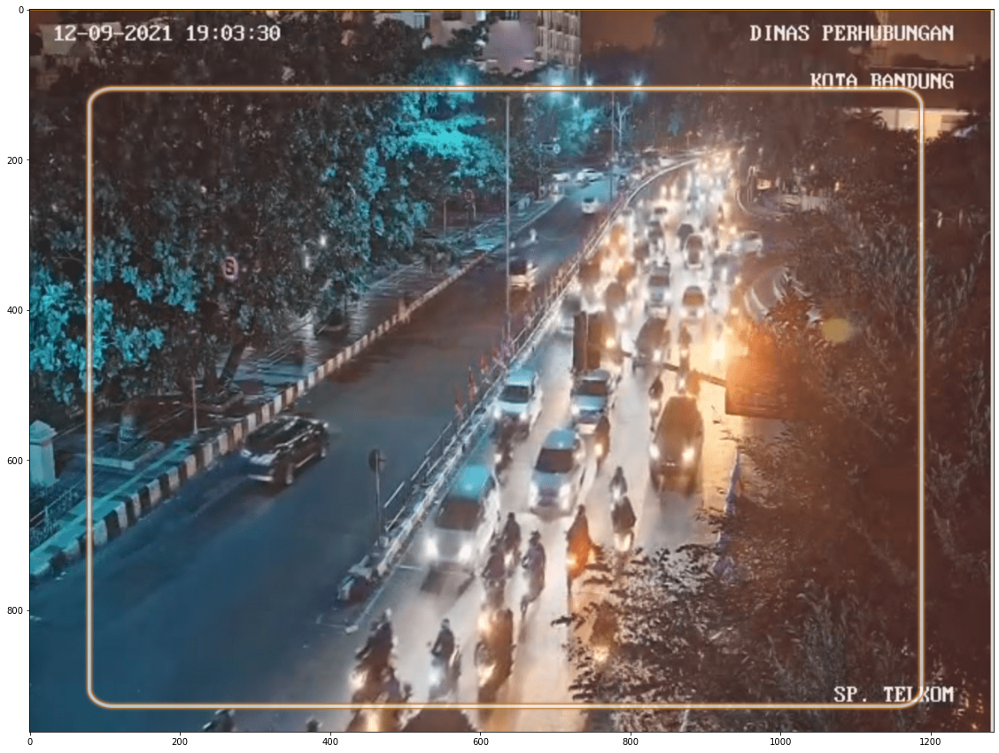

Vehicles: {'Car': 0, 'Motorcycle': 0, 'Bus': 0, 'total': 0}


In [22]:
rekog_res = cv2.imread("traffic4_rekog_res.png")
plt.figure(figsize=(20,15))
plt.imshow(rekog_res)
plt.show()
print('Vehicles:', count_vehicles_rekog(response))

## Research: How did we get here?

### YOLO variants

#### Object Detection Model

In [ ]:
def detect_objects_w_model(image, confidence=0.5, nms_thresh=0.3, model='yolov3', size=None, enable_gpu=False):
    """A method to detect common objects
    Args:
        image: A colour image in a numpy array
        confidence: A value to filter out objects recognised to a lower confidence score
        nms_thresh: An NMS value
        model: The detection model to be used, supported models are: yolov3, yolov3-tiny, yolov4, yolov4-tiny
        enable_gpu: A boolean to set whether the GPU will be used
    """

    Height, Width = image.shape[:2]
    scale = 0.00392

    if model == 'yolov4-p6':
        config_file_name = 'yolov4-p6.cfg'
        cfg_url = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4-p6.cfg'
        weights_file_name = 'yolov4-p6.weights'
        weights_url = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v4_pre/yolov4-p6.weights'
        blob_size = size if size else 1280
        blob = cv2.dnn.blobFromImage(image, scale, (blob_size,blob_size), (0,0,0), True, crop=False)

    elif model == 'yolov4-p5':
        config_file_name = 'yolov4-p5.cfg'
        cfg_url = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4-p5.cfg'
        weights_file_name = 'yolov4-p5.weights'
        weights_url = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v4_pre/yolov4-p5.weights'
        blob_size = size if size else 896
        blob = cv2.dnn.blobFromImage(image, scale, (blob_size,blob_size), (0,0,0), True, crop=False)

    elif model == 'yolov4-csp-x-swish':
        config_file_name = 'yolov4-csp-x-swish.cfg'
        cfg_url = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4-csp-x-swish.cfg'
        weights_file_name = 'yolov4-csp-x-swish.weights'
        weights_url = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v4_pre/yolov4-csp-x-swish.weights'
        blob_size = size if size else 640
        blob = cv2.dnn.blobFromImage(image, scale, (blob_size,blob_size), (0,0,0), True, crop=False)

    elif model == 'yolov4-csp-swish':
        config_file_name = 'yolov4-csp-swish.cfg'
        cfg_url = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4-csp-swish.cfg'
        weights_file_name = 'yolov4-csp-swish.weights'
        weights_url = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v4_pre/yolov4-csp-swish.weights'
        blob_size = size if size else 640
        blob = cv2.dnn.blobFromImage(image, scale, (blob_size,blob_size), (0,0,0), True, crop=False)

    elif model == 'yolov4x-mish':
        config_file_name = 'yolov4x-mish.cfg'
        cfg_url = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4x-mish.cfg'
        weights_file_name = 'yolov4x-mish.weights'
        weights_url = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v4_pre/yolov4x-mish.weights'
        blob_size = size if size else 640
        blob = cv2.dnn.blobFromImage(image, scale, (blob_size,blob_size), (0,0,0), True, crop=False)

    elif model == 'yolov4':
        config_file_name = 'yolov4.cfg'
        cfg_url = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4.cfg'
        weights_file_name = 'yolov4.weights'
        weights_url = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v3_optimal/yolov4.weights'
        blob_size = size if size else 416
        blob = cv2.dnn.blobFromImage(image, scale, (blob_size,blob_size), (0,0,0), True, crop=False)

    elif model == 'yolov4-tiny':
        config_file_name = 'yolov4-tiny.cfg'
        cfg_url = 'https://raw.githubusercontent.com/AlexeyAB/darknet/master/cfg/yolov4-tiny.cfg'
        weights_file_name = 'yolov4-tiny.weights'
        weights_url = 'https://github.com/AlexeyAB/darknet/releases/download/darknet_yolo_v4_pre/yolov4-tiny.weights'
        blob_size = size if size else 416
        blob = cv2.dnn.blobFromImage(image, scale, (blob_size,blob_size), (0,0,0), True, crop=False)

    elif model == 'yolov3-tiny':
        config_file_name = 'yolov3-tiny.cfg'
        cfg_url = "https://github.com/pjreddie/darknet/raw/master/cfg/yolov3-tiny.cfg"
        weights_file_name = 'yolov3-tiny.weights'
        weights_url = 'https://pjreddie.com/media/files/yolov3-tiny.weights'
        blob_size = size if size else 416
        blob = cv2.dnn.blobFromImage(image, scale, (blob_size,blob_size), (0,0,0), True, crop=False)

    else:
        config_file_name = 'yolov3.cfg'
        cfg_url = 'https://github.com/arunponnusamy/object-detection-opencv/raw/master/yolov3.cfg'
        weights_file_name = 'yolov3.weights'
        weights_url = 'https://pjreddie.com/media/files/yolov3.weights'
        blob_size = size if size else 416
        blob = cv2.dnn.blobFromImage(image, scale, (blob_size,blob_size), (0,0,0), True, crop=False)

    config_file_abs_path = DEST_DIR + os.path.sep + config_file_name
    weights_file_abs_path = DEST_DIR + os.path.sep + weights_file_name    
    
    if not os.path.exists(config_file_abs_path):
        download_file(url=cfg_url, file_name=config_file_name, dest_dir=DEST_DIR)

    if not os.path.exists(weights_file_abs_path):
        download_file(url=weights_url, file_name=weights_file_name, dest_dir=DEST_DIR)    

    classes = populate_class_labels()
    net = cv2.dnn.readNet(weights_file_abs_path, config_file_abs_path)

    # enables opencv dnn module to use CUDA on Nvidia card instead of cpu
    if enable_gpu:
        net.setPreferableBackend(cv2.dnn.DNN_BACKEND_CUDA)
        net.setPreferableTarget(cv2.dnn.DNN_TARGET_CUDA)

    net.setInput(blob)

    outs = net.forward(get_output_layers(net))

    class_ids = []
    confidences = []
    boxes = []

    for out in outs:
        for detection in out:
            scores = detection[5:]
            class_id = np.argmax(scores)
            max_conf = scores[class_id]
            if max_conf > confidence:
                center_x = int(detection[0] * Width)
                center_y = int(detection[1] * Height)
                w = int(detection[2] * Width)
                h = int(detection[3] * Height)
                x = center_x - (w / 2)
                y = center_y - (h / 2)
                class_ids.append(class_id)
                confidences.append(float(max_conf))
                boxes.append([x, y, w, h])


    indices = cv2.dnn.NMSBoxes(boxes, confidences, confidence, nms_thresh)

    bbox = []
    label = []
    conf = []

    for i in indices:
        i = i[0]
        box = boxes[i]
        x = box[0]
        y = box[1]
        w = box[2]
        h = box[3]
        bbox.append([int(x), int(y), int(x+w), int(y+h)])
        label.append(str(classes[class_ids[i]]))
        conf.append(confidences[i])
        
    return bbox, label, conf

In [ ]:
# Trial sample with high quality picture
file_name = "traffic.png"

In [ ]:
# YOLOv4-p6
start = time.time()

image = cv2.imread(file_name)
box, labels, count = detect_objects_w_model(image, model="yolov4-p6")
output = draw_bbox(image, box, labels, count)

end = time.time()

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

print('Elapsed time:', end - start, 'seconds')
print('Vehicles:', count_vehicles(labels))

In [ ]:
# YOLOv4-p5
start = time.time()

image = cv2.imread(file_name)
box, labels, count = detect_objects_w_model(image, model="yolov4-p5")
output = draw_bbox(image, box, labels, count)

end = time.time()

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

print('Elapsed time:', end - start, 'seconds')
print('Vehicles:', count_vehicles(labels))

In [ ]:
# YOLOv4-csp-x-swish
start = time.time()

image = cv2.imread(file_name)
box, labels, count = detect_objects_w_model(image, model="yolov4-csp-x-swish")
output = draw_bbox(image, box, labels, count)

end = time.time()

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

print('Elapsed time:', end - start, 'seconds')
print('Vehicles:', count_vehicles(labels))

In [ ]:
# YOLOv4-csp-swish
start = time.time()

image = cv2.imread(file_name)
box, labels, count = detect_objects_w_model(image, model="yolov4-csp-swish")
output = draw_bbox(image, box, labels, count)

end = time.time()

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

print('Elapsed time:', end - start, 'seconds')
print('Vehicles:', count_vehicles(labels))

In [ ]:
# YOLOv4x-mish
start = time.time()

image = cv2.imread(file_name)
box, labels, count = detect_objects_w_model(image, model="yolov4x-mish")
output = draw_bbox(image, box, labels, count)

end = time.time()

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

print('Elapsed time:', end - start, 'seconds')
print('Vehicles:', count_vehicles(labels))

In [ ]:
# YOLOv4
start = time.time()

image = cv2.imread(file_name)
box, labels, count = detect_objects_w_model(image, model="yolov4")
output = draw_bbox(image, box, labels, count)

end = time.time()

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

print('Elapsed time:', end - start, 'seconds')
print('Vehicles:', count_vehicles(labels))

In [ ]:
# YOLOv4-tiny
start = time.time()

image = cv2.imread(file_name)
box, labels, count = detect_objects_w_model(image, model="yolov4-tiny")
output = draw_bbox(image, box, labels, count)

end = time.time()

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

print('Elapsed time:', end - start, 'seconds')
print('Vehicles:', count_vehicles(labels))

In [ ]:
# YOLOv3-tiny
start = time.time()

image = cv2.imread(file_name)
box, labels, count = detect_objects_w_model(image, model="yolov3-tiny")
output = draw_bbox(image, box, labels, count)

end = time.time()

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

print('Elapsed time:', end - start, 'seconds')
print('Vehicles:', count_vehicles(labels))

In [ ]:
# YOLOv3
start = time.time()

image = cv2.imread(file_name)
box, labels, count = detect_objects_w_model(image)
output = draw_bbox(image, box, labels, count)

end = time.time()

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

print('Elapsed time:', end - start, 'seconds')
print('Vehicles:', count_vehicles(labels))

> Simply from the visualization above, the models that accomodate both speed and vehicle count quantity are YOLOv3 and YOLOv4.

#### Hyperparameter tuning (based on vehicle quantity)

In [ ]:
def parameter_tuning(file_name, size_range=range(320, 640, 96), model='yolov3'):
    best_config = []
    output = None
    max_vehicles = 0
    config_data = []
    for size in size_range:
        for conf in [0.1, 0.3, 0.5]:
            for nms in [0.1, 0.3, 0.5]:
                image = cv2.imread(file_name)
                box, labels, count = detect_objects_w_model(
                    image, model=model, confidence=conf,
                    nms_thresh=nms, size=size
                )
                vehicles = count_vehicles(labels)
                config_data.append([
                    size, conf, nms,
                    vehicles['car'], vehicles['motorbike'],
                    vehicles['truck'] + vehicles['bus'],
                    vehicles['total']
                ])
                if vehicles['total'] >= max_vehicles:
                    output = draw_bbox(image, box, labels, count)
                    best_config = [size, conf, nms, vehicles['total']]
                    max_vehicles = vehicles['total']

    df = pd.DataFrame(config_data, columns=[
        "size", "confidence", "nms_thresh",
        "car_count", "motorbike_count", "truck_bus_count", "total_vehicles"
    ])
    return output, best_config, df

In [ ]:
# High quality picture: YOLOv3

output, best_config, df = parameter_tuning('traffic.png')

print("Best config:", best_config)
display(df)

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

In [ ]:
# YOLOv4

output, best_config, df = parameter_tuning('traffic.png', model="yolov4")

print("Best config:", best_config)
display(df)

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

> For now, the best configuration is at 0.1 confidence and 0.5 NMS threshold. Meanwhile in terms of size, it can still vary. <br />
**Trigger Questions**:
- Is vehicle count number really a reliable performance measure?
- Have we considered the possibility of false positives?
- Will it be prone to overfitting?
- Is there one size parameter fits all solution?

#### Size Tuning

In [ ]:
def size_tuning(file_name, size_range=range(320, 1400, 96), model='yolov3'):
    best_config = []
    output = None
    max_vehicles = 0
    config_data = []
    for size in size_range:
        image = cv2.imread(file_name)
        box, labels, count = detect_objects_w_model(
            image, model=model, confidence=0.1,
            nms_thresh=0.5, size=size
        )
        vehicles = count_vehicles(labels)
        config_data.append([
            size,
            vehicles['car'], vehicles['motorbike'],
            vehicles['truck'] + vehicles['bus'],
            vehicles['total']
        ])
        if vehicles['total'] >= max_vehicles:
            output = draw_bbox(image, box, labels, count, write_conf=False)
            best_config = [size, vehicles['total']]
            max_vehicles = vehicles['total']

    df = pd.DataFrame(config_data, columns=[
        "size", "car_count", "motorbike_count", "truck_bus_count", "total_vehicles"
    ])
    return output, best_config, df

In [ ]:
# Low quality picture: YOLOv3

output, best_config, df = size_tuning('traffic2.jpg')

print("Best config:", best_config)
display(df)

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

In [ ]:
# Dark low quality picture: YOLOv3

output, best_config, df = size_tuning('traffic4.jpg')

print("Best config:", best_config)
display(df)

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

In [ ]:
# Low quality picture: YOLOv4

output, best_config, df = size_tuning('traffic2.jpg', model='yolov4')

print("Best config:", best_config)
display(df)

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

In [ ]:
# Dark low quality picture: YOLOv4

output, best_config, df = size_tuning('traffic4.jpg', model='yolov4')

print("Best config:", best_config)
display(df)

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

In [ ]:
# High quality picture: YOLOv4

output, best_config, df = size_tuning('traffic.png', model='yolov4')

print("Best config:", best_config)
display(df)

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

> From visualizations above, we can see that
1. High vehicle count can return false positives, either because of overlapping boxes of one object or just pure mis-detections.
2. Low quality pictures seem to thrive in smaller size parameter, and the opposite goes for high quality pictures.
3. Overfitting is a concern if we deduct conclusions only from vehicle count.

After explorations at more sample images, we can address these concerns by
1. Double checking the vehicle count with the detected image by supervised human judgment.
2. Separating size parameter for low and high quality pictures (making priority configuration for high quality ones).
3. Tuning the parameters to a slightly higher confidence to avoid false positives.

**Result**:
YOLOv4 is the best model for this use case, with the following parameters:
- minimal confidence 21%,
- blob image size of 416x416 pixels, and
- NMS threshold of 50%

#### Result Visualization

In [ ]:
# YOLOv4: Low quality picture
start = time.time()

image = cv2.imread("traffic2.jpg")
box, labels, count = detect_objects_w_model(image, model="yolov4", 
                                confidence=0.21, nms_thresh=0.5, size=416)
end = time.time()

output = draw_bbox(image, box, labels, count)
plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

print('Elapsed time:', end - start, 'seconds')
print('Vehicles:', count_vehicles(labels))

In [ ]:
# YOLOv4: Dark low quality picture
start = time.time()

image = cv2.imread("traffic4.jpg")
box, labels, count = detect_objects_w_model(image, model="yolov4", 
                                confidence=0.21, nms_thresh=0.5, size=416)
end = time.time()

output = draw_bbox(image, box, labels, count)
plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

print('Elapsed time:', end - start, 'seconds')
print('Vehicles:', count_vehicles(labels))

In [ ]:
# YOLOv4: High quality picture (quantity > speed)
start = time.time()

image = cv2.imread("traffic.png")
box, labels, count = detect_objects_w_model(image, model="yolov4", 
                                confidence=0.21, nms_thresh=0.5, size=1280)
output = draw_bbox(image, box, labels, count)

end = time.time()

plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

print('Elapsed time:', end - start, 'seconds')
print('Vehicles:', count_vehicles(labels))

In [ ]:
# YOLOv4: High quality picture (speed > quantity)
start = time.time()

image = cv2.imread("traffic.png")
box, labels, count = detect_objects_w_model(image, model="yolov4", 
                                confidence=0.21, nms_thresh=0.5, size=416)
end = time.time()

output = draw_bbox(image, box, labels, count)
plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

print('Elapsed time:', end - start, 'seconds')
print('Vehicles:', count_vehicles(labels))

In [ ]:
# YOLOv4: Another high quality picture (speed > quantity)
start = time.time()

image = cv2.imread("traffic5.png")
box, labels, count = detect_objects_w_model(image, model="yolov4", 
                                confidence=0.21, nms_thresh=0.5, size=416)
end = time.time()

output = draw_bbox(image, box, labels, count)
plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

print('Elapsed time:', end - start, 'seconds')
print('Vehicles:', count_vehicles(labels))

### SSD Variants

#### Object Detection Model

Prerequisites: Needs GPU

In [ ]:
!pip install torch -q
!pip install torchvision -q

In [ ]:
from matplotlib import cm
from PIL import Image

import torch
from torch import nn
from torchvision import transforms

In [ ]:
#https://pytorch.org/hub/nvidia_deeplearningexamples_ssd/   
utils = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_ssd_processing_utils')

#https://dida.do/blog/how-to-recognise-objects-in-videos-with-pytorch
class ObjectDetectionPipeline:
    def __init__(self, threshold=0.3, device="cuda", cmap_name="tab10_r"):
        # First we need a Transform object to turn numpy arrays to normalised tensors.
        # We are using an SSD300 model that requires 300x300 images.
        # The normalisation values are standard for pretrained pytorch models.
        self.tfms = transforms.Compose([
            transforms.Resize((300, 300)),
            transforms.ToTensor(),
            transforms.Normalize(mean=[0.485, 0.456, 0.406],
                                 std=[0.229, 0.224, 0.225])
        ])
        
        # Next we need a model. We're setting it to evaluation mode and sending it to the correct device.
        # We get some speedup from the gpu but not as much as we could.
        # A more efficient way to do this would be to collect frames to a buffer,
        # run them through the network as a batch, then output them one by one
        self.model = torch.hub.load('NVIDIA/DeepLearningExamples:torchhub', 'nvidia_ssd').eval().to(device)
        
        # Stop the network from keeping gradients.
        # It's not required but it gives some speedup / reduces memory use.
        for param in self.model.parameters():
            param.requires_grad = False
        
        
        self.device = device
        self.threshold = threshold # Confidence threshold for displaying boxes.
        self.cmap = cm.get_cmap(cmap_name) # colour map
        self.classes_to_labels = utils.get_coco_object_dictionary()

    @staticmethod
    def _crop_img(img):
        """Crop an image or batch of images to square"""
        if len(img.shape) == 3:
            y = img.shape[0]
            x = img.shape[1]
        elif len(img.shape) == 4:
            y = img.shape[1]
            x = img.shape[2]
        else:
            raise ValueError(f"Image shape: {img.shape} invalid")
            
        out_size = min((y, x))
        startx = x // 2 - out_size // 2
        starty = y // 2 - out_size // 2
        
        if len(img.shape) == 3:
            return img[starty:starty+out_size, startx:startx+out_size]
        elif len(img.shape) == 4:
            return img[:, starty:starty+out_size, startx:startx+out_size]
        
    def _plot_boxes(self, output_img, labels, boxes):
        """Plot boxes on an image"""
        for label, (x1, y1, x2, y2) in zip(labels, boxes):
            if (x2 - x1) * (y2 - y1) < 0.25:
                # The model seems to output some large boxes that we know cannot be possible.
                # This is a simple rule to remove them.
            
                x1 = int(x1*output_img.shape[1])
                y1 = int(y1*output_img.shape[0])
                x2 = int(x2*output_img.shape[1])
                y2 = int(y2*output_img.shape[0])
            
                rgba = self.cmap(label)
                bgr = rgba[2]*255, rgba[1]*255, rgba[0]*255
                cv2.rectangle(output_img, (x1, y1), (x2, y2), bgr, 2)
                cv2.putText(output_img, self.classes_to_labels[label - 1], (int(x1), int(y1)-10), cv2.FONT_HERSHEY_SIMPLEX, 0.9, bgr, 2)
            
        return output_img
    
    def __call__(self, img):
        """
        Now the call method This takes a raw frame from opencv finds the boxes and draws on it.
        """
        if type(img) == np.ndarray:
            # single image case
            
            # First convert the image to a tensor, reverse the channels, unsqueeze and send to the right device.
            img_tens = self.tfms(Image.fromarray(img[:,:,::-1])).unsqueeze(0).to(self.device)
        
            # Run the tensor through the network.
            # We'll use NVIDIAs utils to decode.
            results = utils.decode_results(self.model(img_tens))
            boxes, labels, conf = utils.pick_best(results[0], self.threshold)

            return self._plot_boxes(img, labels, boxes)
        
        elif type(img) == list:
            # batch case
            if len(img) == 0:
                # Catch empty batch case
                return None
            
            tens_batch = torch.cat([self.tfms(Image.fromarray(x[:,:,::-1])).unsqueeze(0) for x in img]).to(self.device)
            results = utils.decode_results(self.model(tens_batch))
            
            output_imgs = []
            for im, result in zip(img, results):
                boxes, labels, conf = utils.pick_best(result, self.threshold)
                output_imgs.append(self._plot_boxes(im, labels, boxes))
            return output_imgs

        else:
            raise TypeError(f"Type {type(img)} not understood")

In [ ]:
obj_detect = ObjectDetectionPipeline()

frame = cv2.imread("traffic.png")
output = obj_detect(frame)[:,:,::-1]
plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

In [ ]:
# Placeholder of SSD result that requires GPU
ssd_res = cv2.imread("traffic_ssd.png")
plt.figure(figsize=(20,15))
plt.imshow(ssd_res)
plt.show()

In [ ]:
obj_detect = ObjectDetectionPipeline()

frame = cv2.imread("traffic4.jpg")
output = obj_detect(frame)[:,:,::-1]
plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

In [ ]:
# Placeholder of SSD result that requires GPU
ssd_res = cv2.imread("traffic4_ssd.png")
plt.figure(figsize=(20,15))
plt.imshow(ssd_res)
plt.show()

Better output:

In [ ]:
obj_detect = ObjectDetectionPipeline()

frame = cv2.imread("traffic5.png")
output = obj_detect(frame)[:,:,::-1]
plt.figure(figsize=(20,15))
plt.imshow(output)
plt.show()

In [ ]:
# Placeholder of SSD result that requires GPU
ssd_res = cv2.imread("traffic5_ssd.png")
plt.figure(figsize=(20,15))
plt.imshow(ssd_res)
plt.show()